## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration using chessboard images

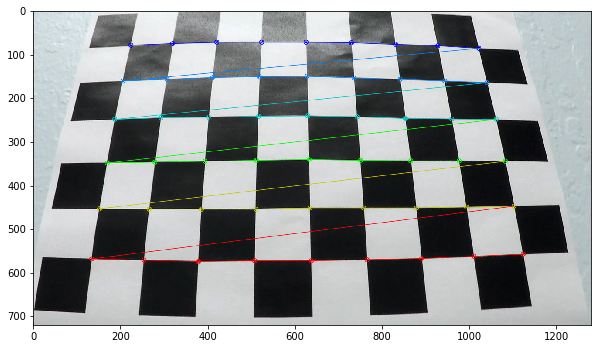

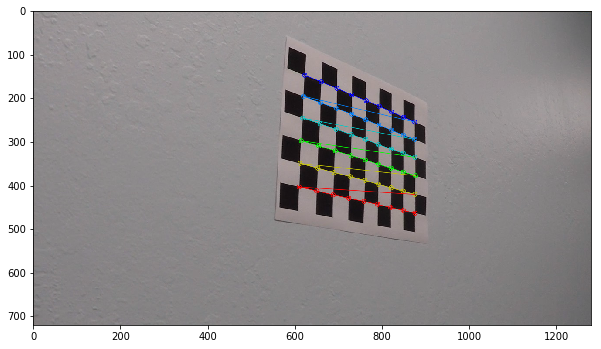

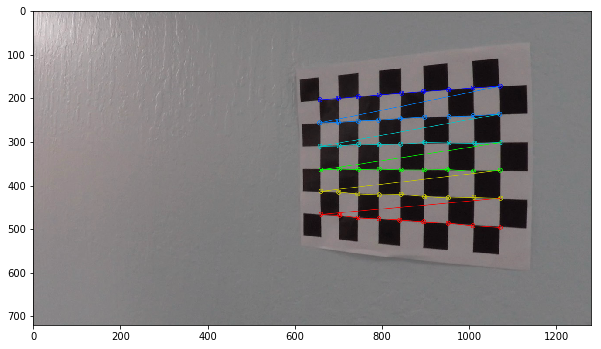

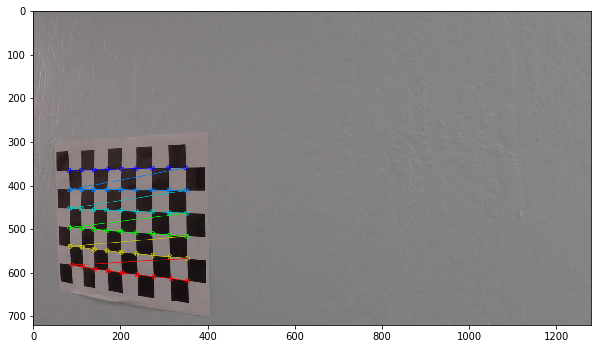

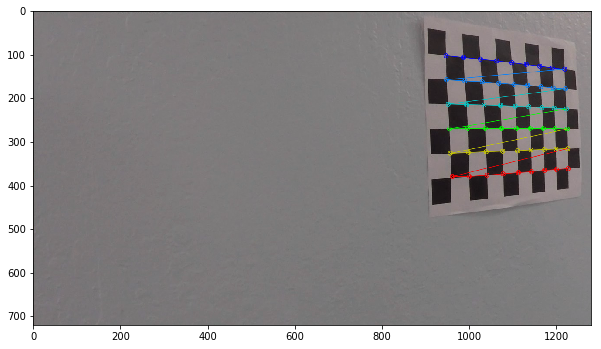

...

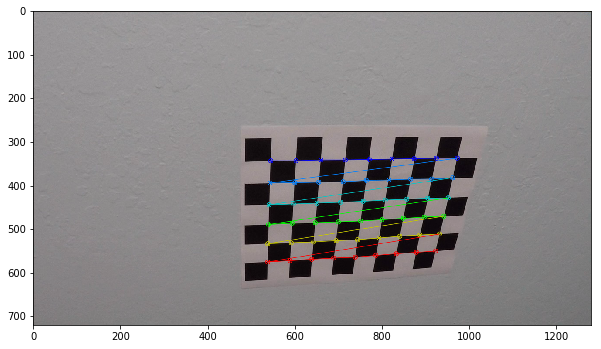

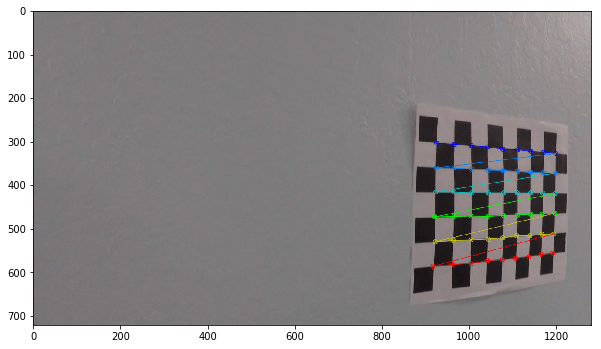

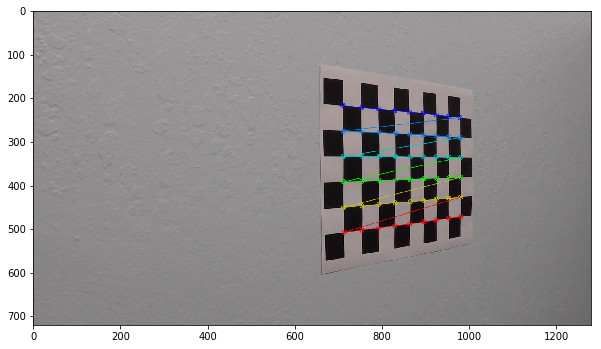

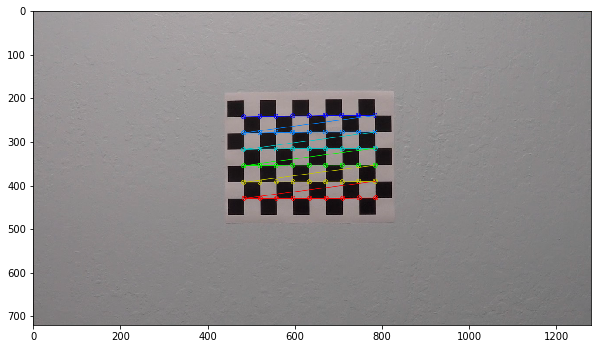

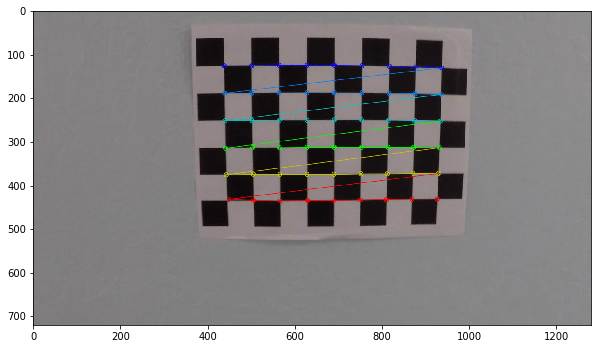

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# prepare the object points here
nx = 9 # The numbe of inside corners in x
ny = 6 # The number of inside corners in y

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)
        plt.figure(figsize=(10,10))
        plt.imshow(img)

#cv2.destroyAllWindows()

In [3]:
images = glob.glob('../test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    
    img_size = (img.shape[1], img.shape[0])
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    undist = cv2.undistort(gray, mtx, dist, None, mtx)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # Check if we get checkboard corners for images in test.
    #print(ret, fname)

    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

## Apply a distortion correction to raw images
This function takes an image, object points and image points
and performs the camera calibration, image distortion correction
and returns the undistorted image

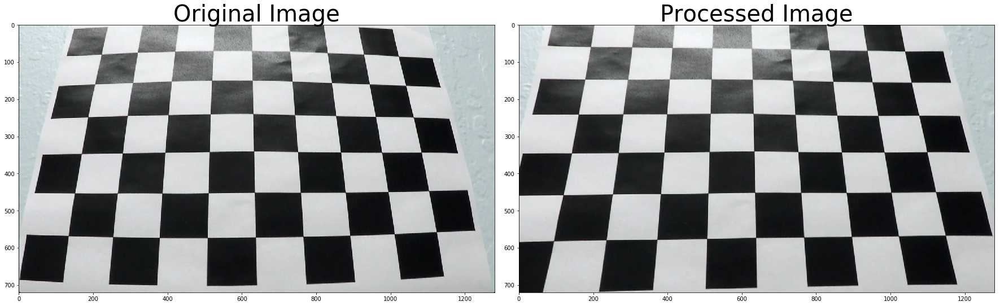

In [4]:
# A utility function for visualising images pre-post some application
def visualise_pre_post(pre_img, post_img, cmap=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(pre_img)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(post_img, cmap=cmap)
    ax2.set_title('Processed Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


def cal_undistort(img, objpoints=objpoints, imgpoints=imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    img_size = (img.shape[1], img.shape[0])
    
    # Calibrate out camera here
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    # undistort the image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

# lets test this
img = cv2.imread('../camera_cal/calibration3.jpg')
   

# Actually lets put in a test function
undist = cal_undistort(img)
visualise_pre_post(img, undist, cmap='gray')

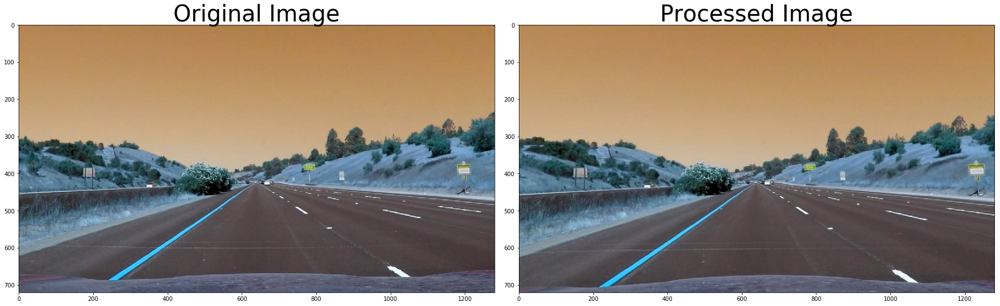

In [6]:
img = cv2.imread('../test_images/straight_lines1.jpg')
undist = cal_undistort(img)
visualise_pre_post(img, undist, cmap='gray')

# Warp image and compute perspective

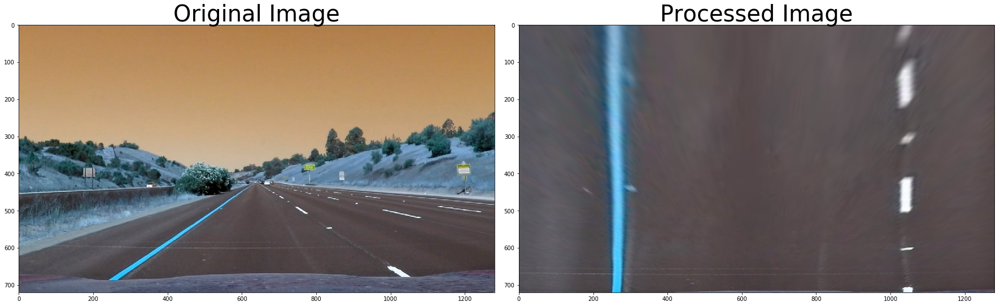

In [7]:
# This function takes an image, number of x and y points,
# camera matrix and distortion coefficients and returns
def warper(img, nx=nx, ny=ny, objpoints=objpoints, imgpoints=imgpoints):
    
    # Use cv2.calibrateCamera() and cv2.undistort()
    img_size = (img.shape[1], img.shape[0])
    
    #ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    # 1) Use the OpenCV undistort function to remove distortion
    #undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # 2) Convert undistorted image to grayscale
    #gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    
    # 3) Search for corners in the grayscale image
    #ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # Lets dynamically do this
    #if ret == True:
        
        # 4) If we find corners, lets visualise them
        #cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        
        # 5) Choose offset from image corners to plot detected corners
        # THis should be chosen to present the result at the proper aspect
        # I will try 100 used in the course example for now
        #offset = 100 
        
        # 6) Grab the image dimensions
        #img_size = (gray.shape[1], gray.shape[0])
        
        # 7) For source points we grab the outer four detected corners
        #src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        
        # 8) Now we grab the destination points
        #dst = np.float32([[offset, offset], [img_size[0]-offset, offset],
        #                 [img_size[0]-offset, img_size[1]-offset],
        #                 [offset, img_size[1] - offset]])
        
        # 9) Given src and dst points, compute the perspective and transform matrix
        #M = cv2.getPerspectiveTransform(src, dst)
        
        # 10) Warp the image
        #warped = cv2.warpPerspective(undist, M, img_size)
    #else:
    # Manually set the parameters to source and destination perspectives
    top_left = (555, 455)
    top_right = (725, 455)
    bottom_left = (0, 680)
    bottom_right = (img_size[0], 680)
    src = np.float32([[top_right],[top_left], [bottom_right], [bottom_left]])
    dst = np.float32([[img_size[0],0], [0,0], [img_size[0], img_size[1]], [0, img_size[1]]])

    # Compute perspective and transform Matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # Warp the image
    warped = cv2.warpPerspective(img, M, img_size)
    # 11) Return the warped image and transform matrix
    return warped, M

# We test our unwarp function here
img = cv2.imread('../test_images/straight_lines1.jpg')
warped, perpestive_M = warper(img, nx=9, ny=6)
visualise_pre_post(img, warped)


## Use Color Transforms, gradients, etc, to create a threshold binary image

# Threshold Gradient

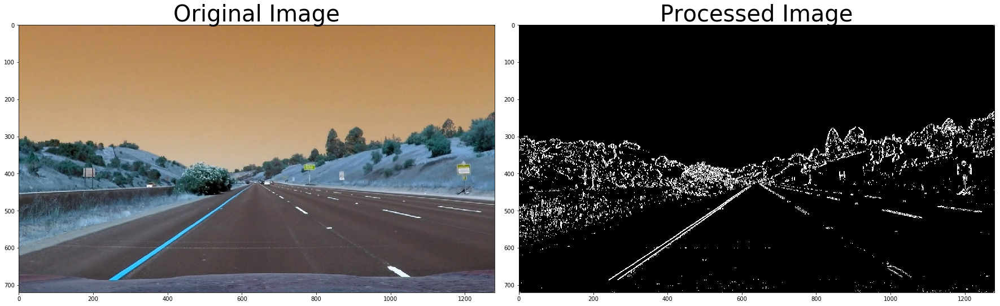

In [8]:
# Define a function that applies Soble x or y
# then takes an absolute value abd applies a threshold.
def abs_sobel_thresh(img, sobel_kernel=3, orient='x', thresh_min=0, thresh_max=255):
    # We systematically apply the following steps to an image
    # 1) Convert to grayscale
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given an orientation
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Now take the absolute value of the derivate or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0-255) then convert to type = np.uint8
    abs_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # 5) Create a max of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(abs_sobel)
    
    binary_output[(abs_sobel >= thresh_min) & (abs_sobel <= thresh_max)] = 1
    
    # 6) Return this mask as the binary_output image
    return binary_output

# Lets test the function here
grad_binary = abs_sobel_thresh(img, sobel_kernel=3, orient='x', thresh_min=20, thresh_max=100)

img = cv2.imread('../test_images/straight_lines1.jpg')

visualise_pre_post(img, grad_binary, cmap='gray')


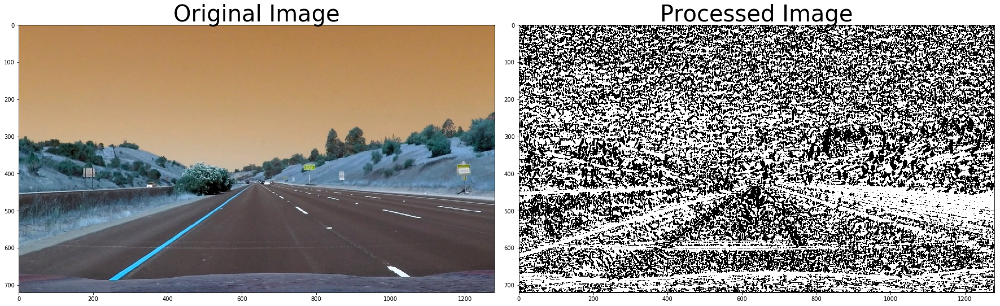

In [13]:
# Here we apply the Sobel operator to x and y axis and then compute the 
# the direction of the gradient and apply a threshold
def dir_threshold(img, sobel_kernel=3, thresh_min=0, thresh_max=np.pi/2):
    """
    Apply the sobel operator, compute the direction of gradient and apply the thresholds
    """
    # We follow some steps for this
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    sobel_abs_x = np.absolute(sobel_x)
    sobel_abs_y = np.absolute(sobel_y)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to compute the direction of the gradient
    abs_grad_dir = np.arctan2(sobel_abs_y, sobel_abs_x).astype(np.uint8)
        
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(abs_grad_dir)
    binary_output[(abs_grad_dir >= thresh_min) & (abs_grad_dir <= thresh_max)] = 1
    
    # 6) Return this mask as binary_output of image
    return binary_output

# Lets test out directional threshold
img = cv2.imread('../test_images/straight_lines1.jpg')
dir_binary = dir_threshold(img, sobel_kernel=15, thresh_min=0.7, thresh_max=1.3)
visualise_pre_post(img, dir_binary, cmap='gray')

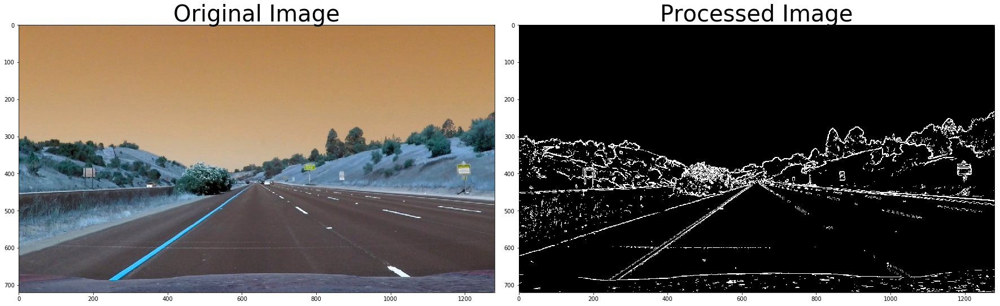

In [14]:
# Here we apply the Sobel operator to both x and y, then compute the 
# magnitude of the gradient and apply a threshold
def mag_threshold(img, sobel_kernel=3, thresh_min=0, thresh_max=255):
    """
    Here we want to apply the Sobel oporator,
    Compute the magnitude of the gradient,
    Then apply the threshold
    """
    # 1) We follow a systematic approach
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take both Sobel x and y gradients
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Compute the gradient magnitude
    grad_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    
    # 4) Rescale t0 8-bit
    scale_factor = np.max(grad_mag) / 255
    grad_mag = (grad_mag/scale_factor).astype(np.uint8)
    
    # 5) Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(grad_mag)
    
    binary_output[(grad_mag >= thresh_min) & (grad_mag <= thresh_max)] = 1
    
    # 6) Return this mask as the binary_output 
    return binary_output

# We test our function here
img = cv2.imread('../test_images/straight_lines1.jpg')
mag_binary = mag_threshold(img, sobel_kernel=3, thresh_min=30, thresh_max=100)
# Visualise the results
visualise_pre_post(img, mag_binary, cmap='gray')

In [15]:
# Refactor the dir_threshold function to work with our abs_sobel_thresh function

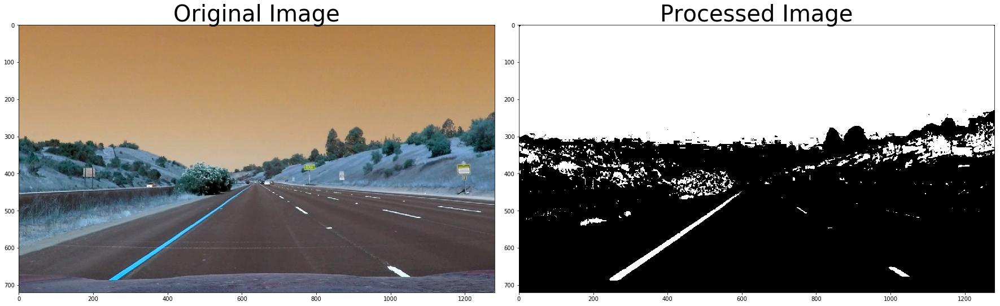

In [16]:
# A color space is a specific organization of colors. They provide a way 
# to categorise colors and represent them in digital images.
# RGB is a red-green-blue one color space. 
# NOte: If you read an image using matplotlib.image.imread() you will get
# an an RGB image but if you use cv2.imread() you get a BGR image.
# HSV is another color space which represents colors in hue, saturation and value.
# HLS is another color space which represents colors in hue, lightness and saturation
# Here we use the HLS color space to detect lane lines different colors and under
# and under different lighting conditions.
# This is good because we know that images are affected by lighting conditions
# This function thresholds the S-Channel HLS
# It uses the exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh_min=0, thresh_max=255):
    # This function implements the HLS color-space because we want
    # the saturation and lightness using the following steps
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # 2) Apply a threshold to the S channel
    S = hls[:, :, 2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh_min) & (S <= thresh_max)] = 1
    
    # 3) Return a binary image or threshold result
    return binary_output

# Lets test drive our HLS color space
img = cv2.imread('../test_images/straight_lines1.jpg')
hls_binary = hls_select(img, thresh_min = 90, thresh_max = 255)

# Lets visualise the results
visualise_pre_post(img, hls_binary, cmap='gray')   

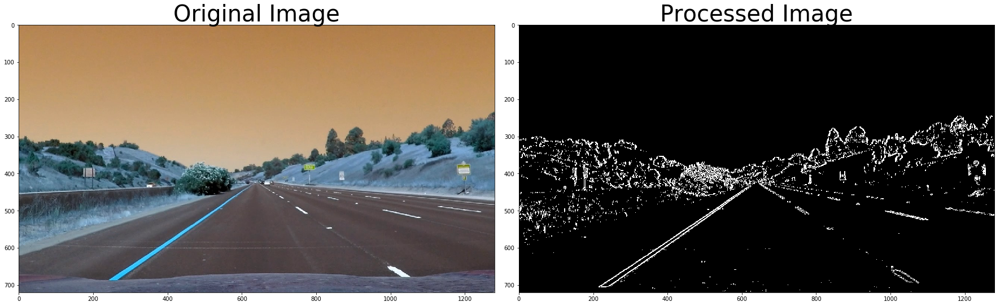

In [17]:
# Combines color threshold and HLS
def pipeline(img, params={'sobel_thresh':(3, 0, 255), 
                          'mag_thresh':(3, 0, 255), 
                          'dir_thresh':(3, 0, 255), 
                          'hls_thresh':(0, 255)}):
    """
    Our pipeline method combines absolute sobel threshold,
    magnitude threshold and directional threshold all in one neat piece of code.
    """
    img = np.copy(img)
    
    # Undistort the image first
    img = cal_undistort(img)
    
    # compute the gradient in x
    grad_x = abs_sobel_thresh(img, orient='x', sobel_kernel=params['sobel_thresh'][0], thresh_min=params['sobel_thresh'][1], thresh_max=params['sobel_thresh'][2])
    
    # compute the gradient in y
    grad_y = abs_sobel_thresh(img, orient='y', sobel_kernel=params['sobel_thresh'][0], thresh_min=params['sobel_thresh'][1], thresh_max=params['sobel_thresh'][2])
    
    # compute the magnitude of gradients 
    mag_binary = mag_threshold(img, sobel_kernel=params['mag_thresh'][0], thresh_min=params['mag_thresh'][1], thresh_max=params['mag_thresh'][2])
    
    # compute gradient direction
    dir_binary = dir_threshold(img, sobel_kernel=params['dir_thresh'][0], thresh_min=params['dir_thresh'][1], thresh_max=params['dir_thresh'][2])
    
    # compute the hue, lightness and saturation
    hls_binary = hls_select(img, thresh_min=params['hls_thresh'][0], thresh_max=params['hls_thresh'][1])
    
    # combine all the above components
    combined = np.zeros_like(dir_binary)
    combined[(grad_x == 1) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
    
    return combined

params = {'sobel_thresh':(3, 20, 100), 
          'mag_thresh':(3, 30, 100), 
          'dir_thresh':(15, 0.7, 1.3), 
          'hls_thresh':(90, 255)}

# We test the pipeline here ...
img = cv2.imread('../test_images/straight_lines1.jpg')
color_binary = pipeline(img, params)
visualise_pre_post(img, color_binary, cmap='gray')
    

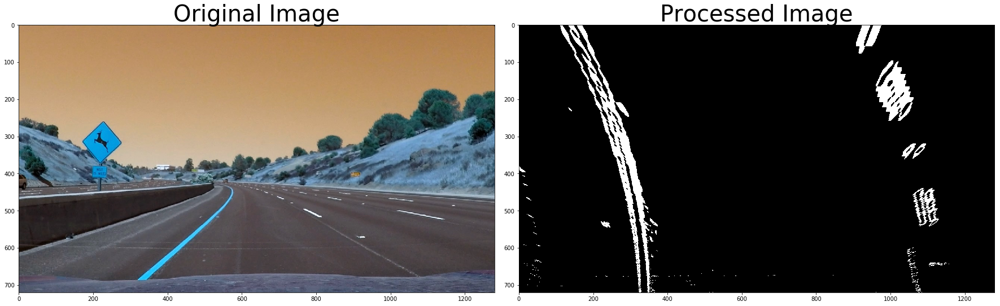

In [18]:
# Now we want to get a binary warped image
def warped(img):
    # We put it throught pipeline
    
    params = {'sobel_thresh':(3, 20, 100), 
          'mag_thresh':(3, 30, 100), 
          'dir_thresh':(15, 0.7, 1.3), 
          'hls_thresh':(90, 255)}
    
    # Now we binary warp it
    combined_binary = pipeline(img, params)
    warped_binary, M = warper(combined_binary)
    
    return warped_binary, M

# Lets test this warped pipeline
img = cv2.imread('../test_images/test2.jpg')
warped_binary, M = warped(img)
visualise_pre_post(img, warped_binary, cmap='gray')

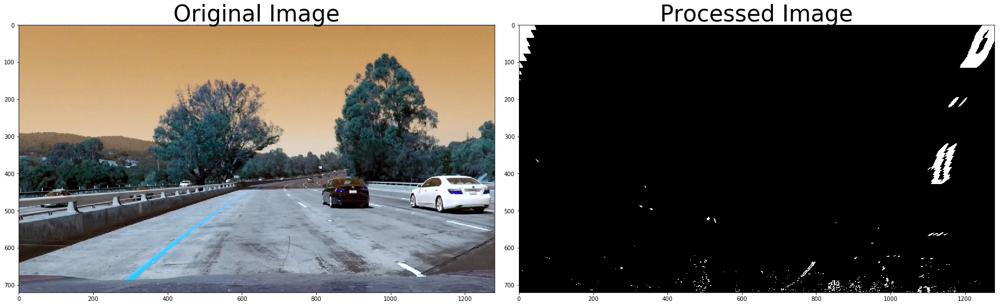

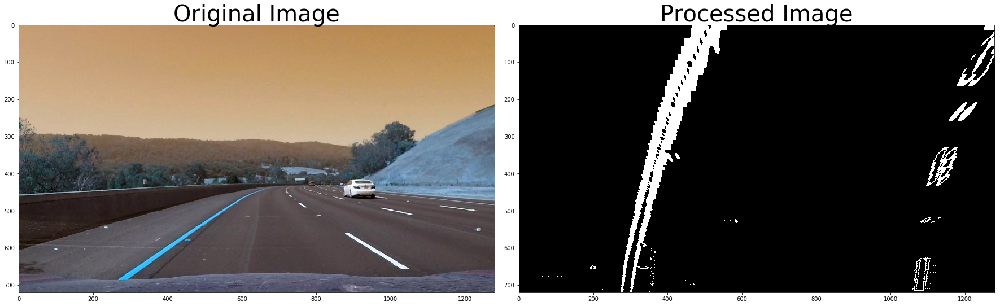

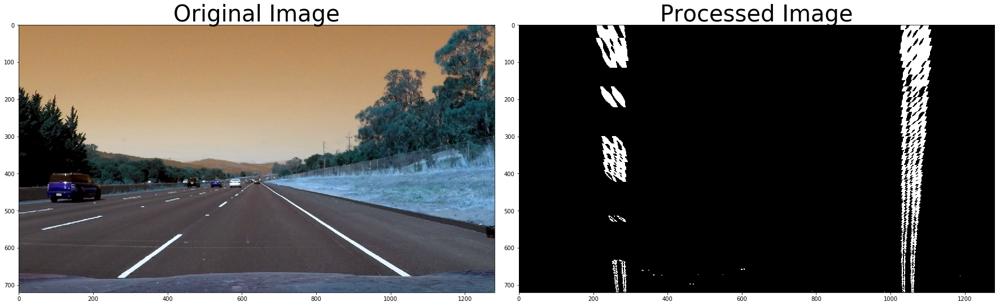

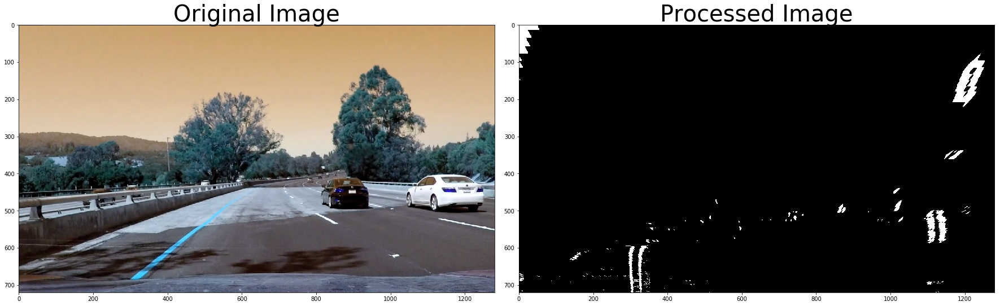

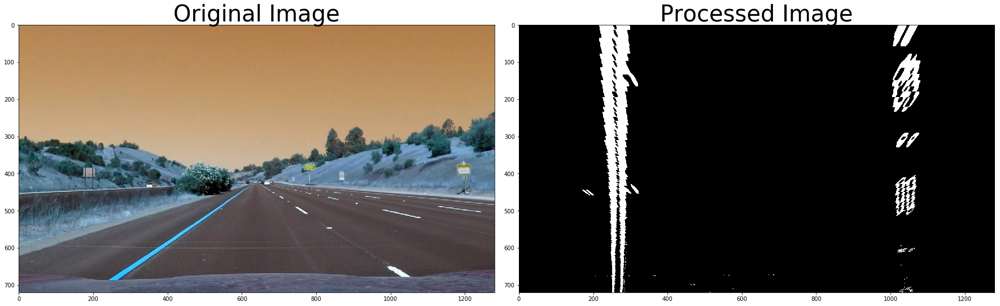

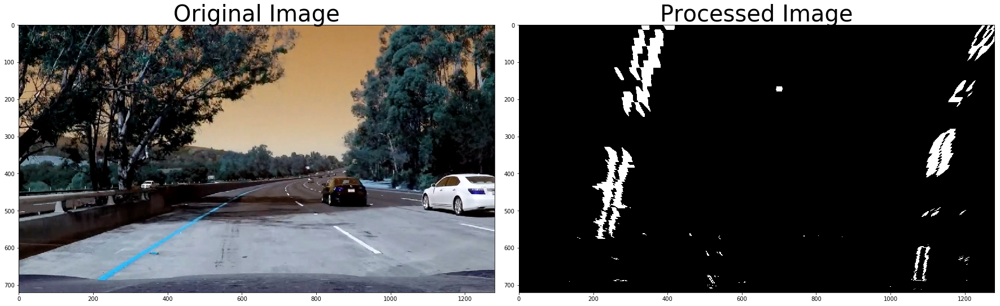

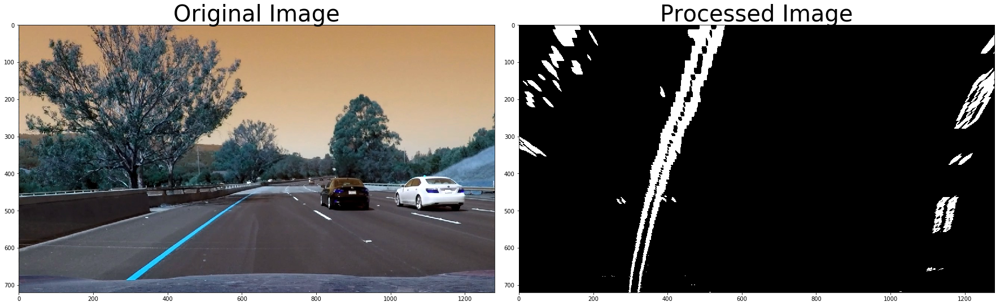

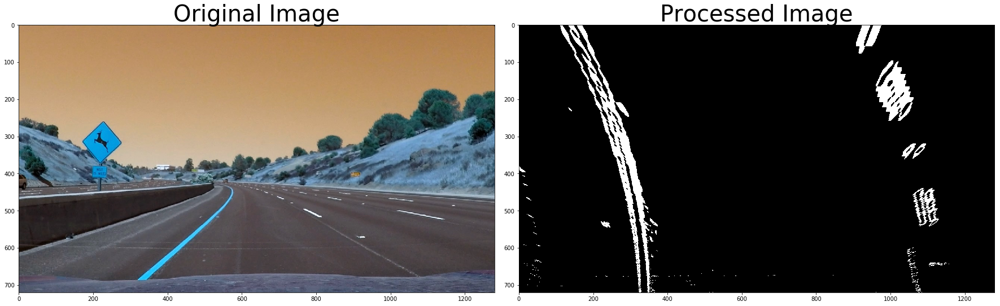

In [19]:
# Lets test drive on a number of images
test_images = glob.glob('../test_images/*.jpg')
for img_path in test_images:
    img = cv2.imread(img_path)
    warped_binary, M = warped(img)
    visualise_pre_post(img, warped_binary, cmap='gray')


## Apply a perspective transform to rectify binary image ("bird-eye-view")

## Detect Lane Pixels and fit to the lane boundary

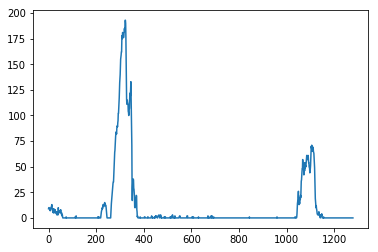

In [20]:
# Load our image
# mpimg.imread will load .jpg as 0-255, so normalize back to 0-1
bottom_half = warped_binary[warped_binary.shape[0]//2:,:]
histogram = np.sum(bottom_half, axis = 0)
plt.plot(histogram)

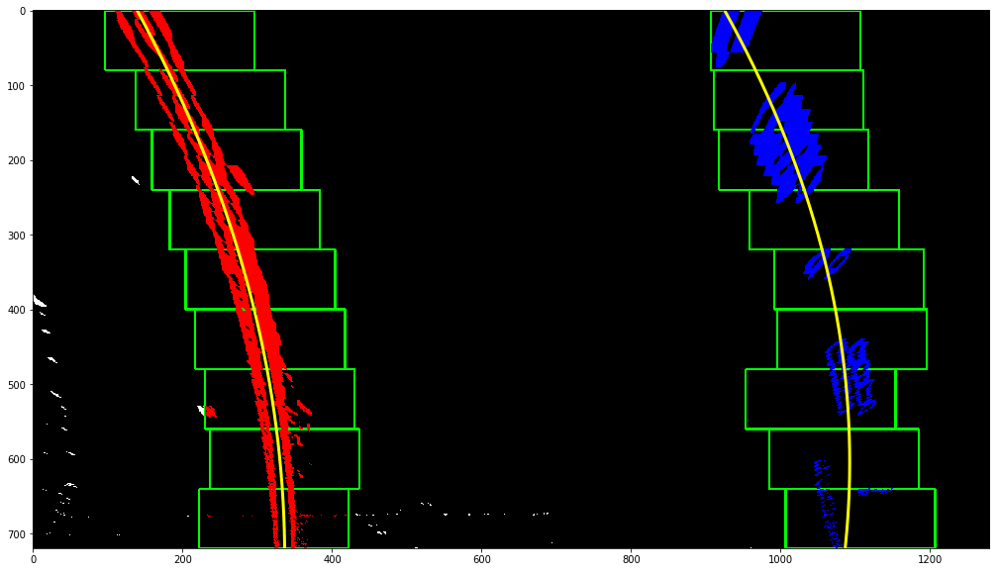

In [44]:
# Now we implement sliding windows and fit a polynomial
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # these will be the starting points of the left and righ lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Some global settings here
    # Sliding windows
    nwindows = 9
    # The width of the windows
    margin = 100
    # Minimum number of pixels found to recenter window
    minpix = 50
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all the nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indeces
    left_lane_inds = []
    right_lane_inds = []
    
    # Now we step through the nwindows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Now we concatenate the arrays of indeces (our pixel lists)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    """
    Fit a polynomial using our lane pixels
    """
    # 1) retrieve lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    # 2) Fit a second polynomial to each using polyfit
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Now generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    #out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [100, 0, 0]
    #out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 100]
        
    
    return out_img, left_fitx, right_fitx, left_fit, right_fit, leftx, lefty, rightx, righty, ploty

out_img, left_fitx, right_fitx, left_fit, right_fit, leftx, lefty, rightx, righty, ploty = fit_polynomial(warped_binary)

# Lets visualise out results
# Plots the left and right polynomials on the lane lines
plt.figure(figsize = (20, 10))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, 'C3', lw=3, color='yellow')
#plt.scatter(left_fitx, ploty, s=120)
plt.plot(right_fitx, ploty, 'C3', lw=3, color='yellow')
#plt.scatter(right_fitx, ploty, s=120)


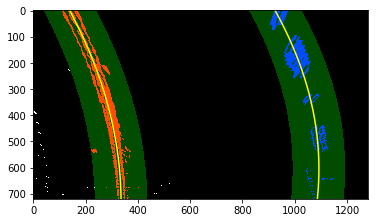

In [22]:
# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
#left_fit = np.array([2.13935315e-04, -3.77507980e-01, 4.76902175e+02])
#right_fit = np.array([4.17622148e-04, -4.93848953e-01, 1.11806170e+03])

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy +
                                   left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy ** 2) +
                                                                         left_fit[1] * nonzeroy + left_fit[
                                                                             2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy +
                                    right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy ** 2) +
                                                                           right_fit[1] * nonzeroy + right_fit[
                                                                               2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)

    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin,
                                                                    ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin,
                                                                     ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    # we change the return values so that
    # we can feed it to measure_curvature function later
    return result, leftx, lefty, rightx, righty, left_fitx, right_fitx, ploty 

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
result, leftx, lefty, rightx, righty, left_fitx, right_fitx, ploty = search_around_poly(warped_binary)
#result, leftx, lefty, rightx, righty, left_fitx, right_fitx, ploty = search_around_poly(warped_binary)

# View your output
plt.imshow(result)

## Determine the curvature of the lane and vehicle position with respect to center

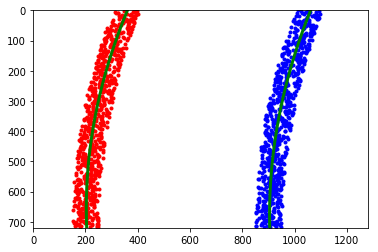

In [23]:
# Lets right some code to determine curvature
import numpy as np
import matplotlib.pyplot as plt
#Generate some fake data to represent lane line pixels
ploty = np.linspace(0, 719, num=720) # to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coeeficient

# For each y position generate random x position within +/- pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

In [24]:
def generate_data():
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)  # to cover same y-range as image
    quadratic_coeff = 3e-4  # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y ** 2) * quadratic_coeff + np.random.randint(-50, high=51)
                      for y in ploty])
    rightx = np.array([900 + (y ** 2) * quadratic_coeff + np.random.randint(-50, high=51)
                       for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)

    return ploty, left_fit, right_fit


def measure_curvature_pixels():
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    ploty, left_fit, right_fit = generate_data()

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2 * left_fit[0] * y_eval + left_fit[1]) ** 2) ** 1.5) / np.absolute(2 * left_fit[0])
    right_curverad = ((1 + (2 * right_fit[0] * y_eval + right_fit[1]) ** 2) ** 1.5) / np.absolute(2 * right_fit[0])

    return left_curverad, right_curverad


# Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad = measure_curvature_pixels()

print(left_curverad, right_curverad)
# Should see values of 1625.06 and 1976.30 here, if using
# the default `generate_data` function with given seed number

1625.06018317 1976.29673077


In [25]:
# From Pixels to Real world
# We have so far calculated curvature based on pixel values, so the radius we are reporting is in pixel space
# which is ofcourse not real world space. We must do the conversion
# We need to repeat this calculation after converting our x and y values to real world space
def generate_data(ym_per_pix, xm_per_pix):
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Fit a second order polynomial to pixel positions in each fake lane line
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return ploty, left_fit_cr, right_fit_cr

# This involves measuring how long and wide the section of the lane is that we
# projecting our warped image.

def measure_curvature_real():
    """
    Calculates the curvature of polynomial functions in meters.
    """
    # We are assuming for now that a lane is about 30 meters long and 3.7 meters wide per US standards
    # Now lets say that our camera has 720 relevant pixels in the y-dimension (our
    # image is perspective transformed) and 700 relevent pixels in the x-dimension
    y_pixels = 720
    x_pixels = 700
    # Therefore to convert from pixels to real-world meter measurements we have
    lane_length = 30 # lane length in meters per US regulations
    lane_width = 3.7 # lane width in meters per US regulations

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = lane_length/y_pixels # meters per pixel in y dimension
    xm_per_pix = lane_width/x_pixels # meters per pixel in x dimension
    
    # For now we generate fake data as an example
    # We will link this to the actual code just now
    ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad


# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real()

print(left_curverad, 'm', right_curverad, 'm')
# Should see values of 533.75 and 648.16 here, if using
# the default `generate_data` function with given seed number


533.752588921 m 648.157485143 m


In [26]:
class PixelToRealWorld(object):
    def __init__(self, x_pixel, y_pixel, lane_length, lane_width):
        self.x_pixel = x_pixel
        self.y_pixel = y_pixel
        self.lane_length = lane_length
        self.lane_width = lane_width
    
    def convert(self):
        if self.y_pixel <= 0 | self.x_pixel <= 0:
            return (0, 0)
        ym_per_pix = self.lane_length/self.y_pixel
        xm_per_pix = self.lane_width/self.x_pixel
        return(ym_per_pix, xm_per_pix)
    
pixToReal = PixelToRealWorld(700, 720, 30, 3.7)
pix_to_realworld = pixToReal.convert()

def measure_curvature(ploty, leftx, lefty, rightx, righty, px_convertor=(1.0, 1.0)):
    """
    We combine geneate data above and measure curvature to create 
    one measure_curvature function.
    We already computed ploty, leftx, lefty, rightx, righty in search
    around poly. We must just plug them here and voila!
    """
    ym_per_pix, xm_per_pix = px_convertor[0], px_convertor[1]
    
    # We define y-value where we want radius of curvature
    # we will choose the maximum -y-value corresponding to the bottom
    # of our image.
    y_eval = np.max(ploty)
    
    # Fit a second order polynomial to pixel positions in each lane
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

# We test our function here
out_img, left_fitx, right_fitx, left_fit, right_fit, leftx, lefty, rightx, righty, ploty = fit_polynomial(warped_binary)
left_curverad, right_curverad = measure_curvature(ploty, leftx, lefty, rightx, righty, px_convertor=pix_to_realworld)
print('[ info ] {}m, {}m'.format(left_curverad, right_curverad))

[ info ] 449.07199998508713m, 359.0049841718025m


## We combine everything to draw our outputs on a lane

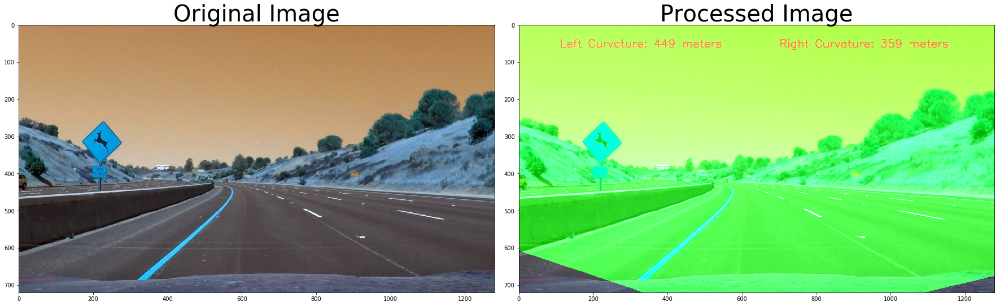

In [49]:
def draw_lane(img):
    """
    lets draw our lane here.
    """
    img_shape = (img.shape[1], img.shape[0])
    warped_binary, M = warped(img)
    result_img, left_fitx, right_fitx, left_fit, right_fit, leftx, lefty, rightx, righty, ploty = fit_polynomial(warped_binary)
    left_curverad, right_curverad = measure_curvature(ploty, leftx, lefty, rightx, righty, px_convertor=pix_to_realworld)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M, (img.shape[1], img.shape[0])) 
    
    left_txt = 'Left Curvature: {} meters'.format(str(int(left_curverad)))
    right_txt = 'Right Curvature: {} meters'.format(str(int(right_curverad)))
    
    # font
    font_face = cv2.FONT_HERSHEY_SIMPLEX
    
    # position
    org_left_txt = (110, 60)
    org_right_txt = (700, 60)
    
    # font scale (size)
    font_scale = 1
    
    # font color 
    font_color = (255, 0, 0)
    
    # line thickness
    line_thickness = 2
       
    cv2.putText(newwarp, left_txt, org_left_txt, font_face, font_scale, font_color, line_thickness, cv2.LINE_AA)
    cv2.putText(newwarp, right_txt, org_right_txt, font_face, font_scale, font_color, line_thickness, cv2.LINE_AA)
    
    result = cv2.addWeighted(img, 1, newwarp, 0.7, 0)
    
    return result
    
# Lets test our function here
img = cv2.imread('../test_images/test2.jpg')
new_img = draw_lane(img)
visualise_pre_post(img, new_img, cmap='gray')
    

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position